**IMPORTING LIBRARIES**

In [78]:
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

pd.options.mode.chained_assignment = None

**READING THE DATA SET**

In [79]:
df = pd.read_csv('/content/movies.csv',encoding="ISO-8859-1")  #The encoding is given as a parameter as the data was in that encoding 

**LOOKING AT THE DATASET head**

In [80]:
df.head()

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,year
0,8000000.0,Columbia Pictures Corporation,USA,Rob Reiner,Adventure,52287414.0,Stand by Me,R,1986-08-22,89,8.1,Wil Wheaton,299174,Stephen King,1986
1,6000000.0,Paramount Pictures,USA,John Hughes,Comedy,70136369.0,Ferris Bueller's Day Off,PG-13,1986-06-11,103,7.8,Matthew Broderick,264740,John Hughes,1986
2,15000000.0,Paramount Pictures,USA,Tony Scott,Action,179800601.0,Top Gun,PG,1986-05-16,110,6.9,Tom Cruise,236909,Jim Cash,1986
3,18500000.0,Twentieth Century Fox Film Corporation,USA,James Cameron,Action,85160248.0,Aliens,R,1986-07-18,137,8.4,Sigourney Weaver,540152,James Cameron,1986
4,9000000.0,Walt Disney Pictures,USA,Randal Kleiser,Adventure,18564613.0,Flight of the Navigator,PG,1986-08-01,90,6.9,Joey Cramer,36636,Mark H. Baker,1986


**CHECKING IF THERE IS ANY MISSING DATA IN THE DATASET**

In [81]:
for col in df.columns:
    percent_missing = np.mean(df[col].isnull())
    print('{} - {}%'.format(col, round(percent_missing*100)))

budget - 0%
company - 0%
country - 0%
director - 0%
genre - 0%
gross - 0%
name - 0%
rating - 0%
released - 0%
runtime - 0%
score - 0%
star - 0%
votes - 0%
writer - 0%
year - 0%


**CHECKING THE DATA TYPES OF ALL COLUMNS**

In [82]:
print(df.dtypes)

budget      float64
company      object
country      object
director     object
genre        object
gross       float64
name         object
rating       object
released     object
runtime       int64
score       float64
star         object
votes         int64
writer       object
year          int64
dtype: object


**CHANGING THE DATA TYPE OF SOME COLUMNS ACCORDING TO REQUIREMENT**

In [83]:
df['budget'] = df['budget'].astype('int64')
df['gross'] = df['gross'].astype('int64')

**DATA FORMATTING AS SOME OF THE YEARS HAVE BEEN PRINTED WRONG IN THE YEAR COLUMN COMPARED TO THE RELEASED COLUMN**

In [84]:
df['released'].astype(str).str[:4].astype(int).equals(df['year'])

False

In [85]:
del df['year']
df['yearcorrect'] = df['released'].astype(str).str[:4]

**SORTING THE TABLE BY THE GROSS COLUMN IN DESCENDING ORDER**

In [86]:
df.sort_values(by =['gross'],inplace = False,ascending = False)

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,yearcorrect
6380,245000000,Lucasfilm,USA,J.J. Abrams,Action,936662225,Star Wars: The Force Awakens,PG-13,2015-12-18,136,8.1,Daisy Ridley,687192,Lawrence Kasdan,2015
5061,237000000,Twentieth Century Fox Film Corporation,UK,James Cameron,Action,760507625,Avatar,PG-13,2009-12-18,162,7.8,Sam Worthington,954412,James Cameron,2009
2420,200000000,Twentieth Century Fox Film Corporation,USA,James Cameron,Drama,658672302,Titanic,PG-13,1997-12-19,194,7.8,Leonardo DiCaprio,862554,James Cameron,1997
6391,150000000,Universal Pictures,USA,Colin Trevorrow,Action,652270625,Jurassic World,PG-13,2015-06-12,124,7.0,Chris Pratt,469200,Rick Jaffa,2015
5723,220000000,Marvel Studios,USA,Joss Whedon,Action,623357910,The Avengers,PG-13,2012-05-04,143,8.1,Robert Downey Jr.,1064633,Joss Whedon,2012
4840,185000000,Warner Bros.,USA,Christopher Nolan,Action,534858444,The Dark Knight,PG-13,2008-07-18,152,9.0,Christian Bale,1839571,Jonathan Nolan,2008
6614,200000000,Lucasfilm,USA,Gareth Edwards,Action,532177324,Rogue One,PG-13,2016-12-16,133,7.9,Felicity Jones,365473,Chris Weitz,2016
6687,200000000,Pixar Animation Studios,USA,Andrew Stanton,Animation,486295561,Finding Dory,PG,2016-06-17,97,7.4,Ellen DeGeneres,173005,Andrew Stanton,2016
2870,115000000,Lucasfilm,USA,George Lucas,Action,474544677,Star Wars: Episode I - The Phantom Menace,PG,1999-05-19,136,6.5,Ewan McGregor,584809,George Lucas,1999
6398,250000000,Marvel Studios,USA,Joss Whedon,Action,459005868,Avengers: Age of Ultron,PG-13,2015-05-01,141,7.4,Robert Downey Jr.,537832,Joss Whedon,2015


**TO LOOK AT ALL THE ROWS  OF THE DATASET**

In [87]:
pd.set_option('display.max_rows', None)

**DROPPING ALL THE DUPLICATES**

In [88]:
df.drop_duplicates()

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,yearcorrect
0,8000000,Columbia Pictures Corporation,USA,Rob Reiner,Adventure,52287414,Stand by Me,R,1986-08-22,89,8.1,Wil Wheaton,299174,Stephen King,1986
1,6000000,Paramount Pictures,USA,John Hughes,Comedy,70136369,Ferris Bueller's Day Off,PG-13,1986-06-11,103,7.8,Matthew Broderick,264740,John Hughes,1986
2,15000000,Paramount Pictures,USA,Tony Scott,Action,179800601,Top Gun,PG,1986-05-16,110,6.9,Tom Cruise,236909,Jim Cash,1986
3,18500000,Twentieth Century Fox Film Corporation,USA,James Cameron,Action,85160248,Aliens,R,1986-07-18,137,8.4,Sigourney Weaver,540152,James Cameron,1986
4,9000000,Walt Disney Pictures,USA,Randal Kleiser,Adventure,18564613,Flight of the Navigator,PG,1986-08-01,90,6.9,Joey Cramer,36636,Mark H. Baker,1986
5,6000000,Hemdale,UK,Oliver Stone,Drama,138530565,Platoon,R,1987-02-06,120,8.1,Charlie Sheen,317585,Oliver Stone,1987
6,25000000,Henson Associates (HA),UK,Jim Henson,Adventure,12729917,Labyrinth,PG,1986-06-27,101,7.4,David Bowie,102879,Dennis Lee,1986
7,6000000,De Laurentiis Entertainment Group (DEG),USA,David Lynch,Drama,8551228,Blue Velvet,R,1986-10-23,120,7.8,Isabella Rossellini,146768,David Lynch,1986
8,9000000,Paramount Pictures,USA,Howard Deutch,Comedy,40471663,Pretty in Pink,PG-13,1986-02-28,96,6.8,Molly Ringwald,60565,John Hughes,1986
9,15000000,SLM Production Group,USA,David Cronenberg,Drama,40456565,The Fly,R,1986-08-15,96,7.5,Jeff Goldblum,129698,George Langelaan,1986


**LOOKING AT THE UNIQUE COMPANY NAMES**

In [89]:
df['company'].drop_duplicates().sort_values(ascending = False)

5288                                          micro_scope
3486                                             i5 Films
6084                                                 erbp
3225                                       double A Films
2707                          Zucker Brothers Productions
1495                                   Zeta Entertainment
5905                                 Zentropa Productions
5917                        Zentropa International Norway
2742                              Zentropa Entertainments
329                                  Zenith Entertainment
4710                                      Zazen Produções
542                              Zanuck/Brown Productions
698                                   Zanuck Company, The
499                           Zacharias-Buhai Productions
4687                           Young Hannibal Productions
5084                                          Yellow Bird
4118                                       Yash Raj Films
4578          

**SCATTER PLOT OF GROSS VS BUDGET**

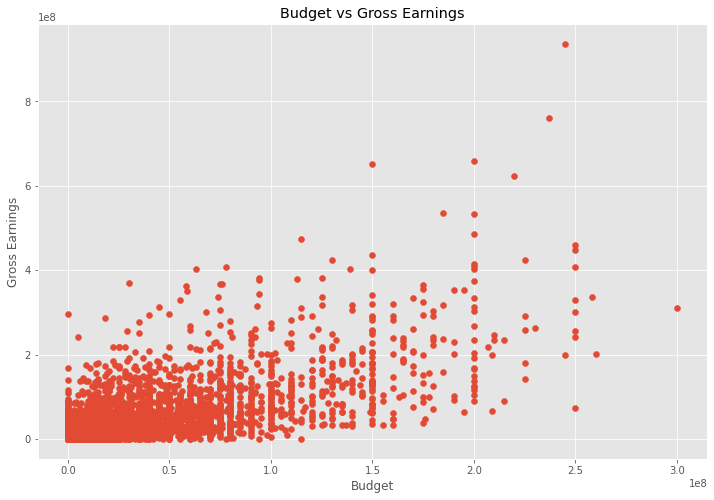

In [90]:
plt.scatter(x = df['budget'],y = df['gross'])
plt.title('Budget vs Gross Earnings')
plt.xlabel('Budget')
plt.ylabel('Gross Earnings')
plt.show()

**REGRESSION PLOT OF BUDGET VS GROSS**
This plot tells us that the labels are positively correlated.

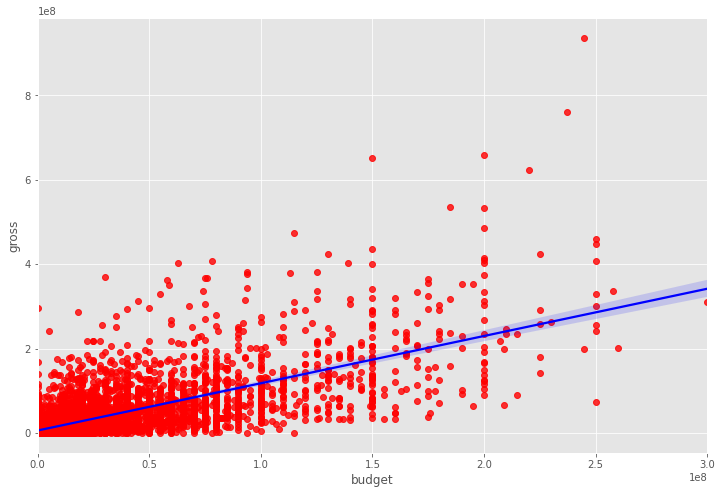

In [91]:
sns.regplot(x="budget", y="gross", data=df,scatter_kws={"color":"red"},line_kws={"color":"blue"})

**CORRELATION BETWEEN ALL COLUMNS USING PEARSON METHOD AND WORKS ONLY FOR NUMERICAL FIELDS**

In [92]:
df.corr(method ='pearson')

,budget,gross,runtime,score,votes
budget,1.000000,0.712196,0.268226,0.042145,0.503924
gross,0.712196,1.000000,0.224579,0.165693,0.662457
runtime,0.268226,0.224579,1.000000,0.395343,0.317399
score,0.042145,0.165693,0.395343,1.000000,0.393607
votes,0.503924,0.662457,0.317399,0.393607,1.000000


**CORRELATION BETWEEN ALL COLUMNS USING KENDALL METHOD AND WORKS ONLY FOR NUMERICAL FIELDS**

In [93]:
df.corr(method ='kendall')

,budget,gross,runtime,score,votes
budget,1.000000,0.523459,0.164816,-0.019526,0.451137
gross,0.523459,1.000000,0.139270,0.033163,0.479772
runtime,0.164816,0.139270,1.000000,0.282068,0.195640
score,-0.019526,0.033163,0.282068,1.000000,0.272967
votes,0.451137,0.479772,0.195640,0.272967,1.000000


**CORRELATION BETWEEN ALL COLUMNS USING SPEARMAN METHOD AND WORKS ONLY FOR NUMERICAL FIELDS**

In [94]:
df.corr(method = 'spearman')

,budget,gross,runtime,score,votes
budget,1.000000,0.698639,0.231672,-0.027868,0.616419
gross,0.698639,1.000000,0.202905,0.045582,0.667869
runtime,0.231672,0.202905,1.000000,0.398840,0.287150
score,-0.027868,0.045582,0.398840,1.000000,0.392199
votes,0.616419,0.667869,0.287150,0.392199,1.000000


**HEAT MAP OF THE CORRELATION MATRIX**

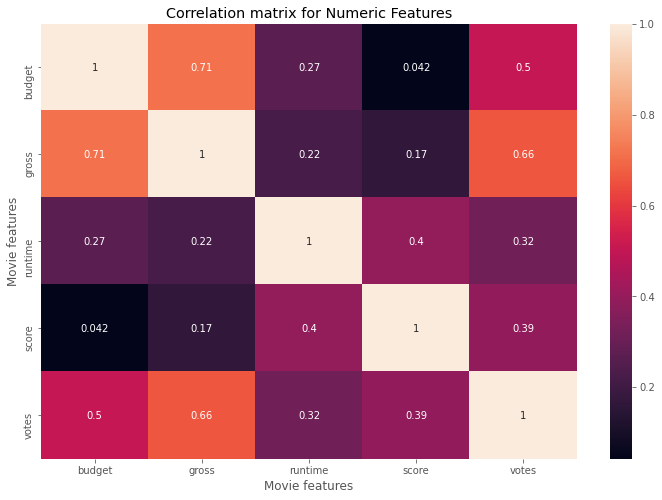

In [95]:
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot = True)
plt.title("Correlation matrix for Numeric Features")
plt.xlabel("Movie features")
plt.ylabel("Movie features")
plt.show()

**ASSIGNING CATEGORICAL VALUES TO THE OBJECT TYPE COLUMNS IN THE DATA SET**

In [96]:
df.apply(lambda x: x.factorize()[0]).corr(method='pearson')

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,yearcorrect
budget,1.000000,-0.053390,-0.058972,0.098884,0.009617,0.265780,0.260056,0.033532,0.267866,0.182441,-0.019359,0.082724,0.276622,0.168884,0.227619
company,-0.053390,1.000000,0.207891,0.528937,0.083304,0.595539,0.585783,0.035007,0.590363,-0.017205,-0.028393,0.499675,0.556854,0.525347,0.459923
country,-0.058972,0.207891,1.000000,0.139928,0.026460,0.110702,0.109299,0.170565,0.114623,0.088068,-0.010712,0.153764,0.101652,0.138723,0.092074
director,0.098884,0.528937,0.139928,1.000000,0.050684,0.718102,0.708987,0.059209,0.714279,-0.048564,-0.015889,0.621374,0.692806,0.711480,0.566743
genre,0.009617,0.083304,0.026460,0.050684,1.000000,0.061585,0.064614,0.045332,0.063290,0.068504,-0.044007,0.064794,0.057885,0.054884,0.054964
gross,0.265780,0.595539,0.110702,0.718102,0.061585,1.000000,0.980170,0.015757,0.988701,0.067788,-0.036941,0.696549,0.963910,0.795554,0.795888
name,0.260056,0.585783,0.109299,0.708987,0.064614,0.980170,1.000000,0.016060,0.971935,0.065114,-0.035479,0.686017,0.946291,0.786625,0.781578
rating,0.033532,0.035007,0.170565,0.059209,0.045332,0.015757,0.016060,1.000000,0.018538,0.019492,0.012675,0.083682,0.007277,0.037288,0.021475
released,0.267866,0.590363,0.114623,0.714279,0.063290,0.988701,0.971935,0.018538,1.000000,0.073431,-0.039006,0.692609,0.955360,0.790091,0.798753
runtime,0.182441,-0.017205,0.088068,-0.048564,0.068504,0.067788,0.065114,0.019492,0.073431,1.000000,-0.010943,-0.005030,0.080750,0.016035,0.065295


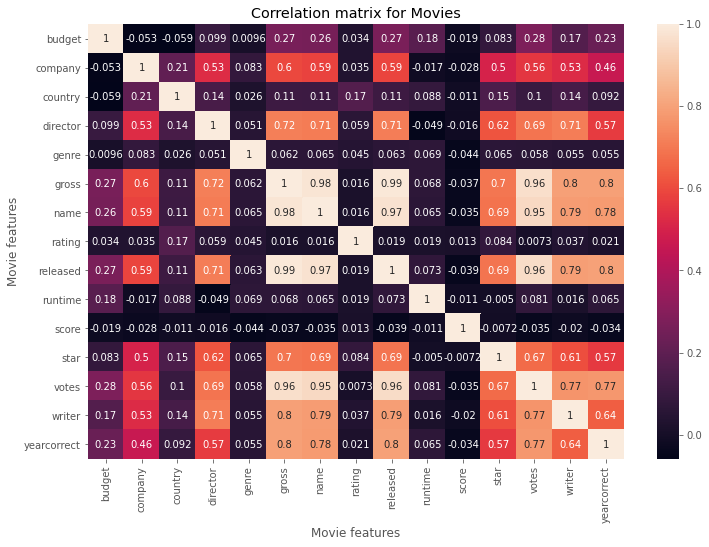

In [97]:
correlation_matrix = df.apply(lambda x: x.factorize()[0]).corr(method='pearson')

sns.heatmap(correlation_matrix, annot = True)

plt.title("Correlation matrix for Movies")

plt.xlabel("Movie features")

plt.ylabel("Movie features")

plt.show()


**UNSTACKING THE CORRELATION MATRIX SO AS TO SEE IT IN A TABULAR FORM**

In [98]:
correlation_mat = df.apply(lambda x: x.factorize()[0]).corr()

corr_pairs = correlation_mat.unstack()

print(corr_pairs)

budget       budget         1.000000
             company       -0.053390
             country       -0.058972
             director       0.098884
             genre          0.009617
             gross          0.265780
             name           0.260056
             rating         0.033532
             released       0.267866
             runtime        0.182441
             score         -0.019359
             star           0.082724
             votes          0.276622
             writer         0.168884
             yearcorrect    0.227619
company      budget        -0.053390
             company        1.000000
             country        0.207891
             director       0.528937
             genre          0.083304
             gross          0.595539
             name           0.585783
             rating         0.035007
             released       0.590363
             runtime       -0.017205
             score         -0.028393
             star           0.499675
 

**SORTING THE CORRELATION TABLE USING QUICK SORT**

In [99]:
sorted_pairs = corr_pairs.sort_values(kind="quicksort")

print(sorted_pairs)

budget       country       -0.058972
country      budget        -0.058972
budget       company       -0.053390
company      budget        -0.053390
director     runtime       -0.048564
runtime      director      -0.048564
genre        score         -0.044007
score        genre         -0.044007
             released      -0.039006
released     score         -0.039006
score        gross         -0.036941
gross        score         -0.036941
name         score         -0.035479
score        name          -0.035479
             votes         -0.035217
votes        score         -0.035217
yearcorrect  score         -0.034471
score        yearcorrect   -0.034471
company      score         -0.028393
score        company       -0.028393
             writer        -0.019683
writer       score         -0.019683
budget       score         -0.019359
score        budget        -0.019359
company      runtime       -0.017205
runtime      company       -0.017205
score        director      -0.015889
d

**SEGREGATING THE PAIRS WHICH HAD ABSOLUTE CORRELATION MORE THAN 0.5**

In [100]:
strong_pairs = sorted_pairs[abs(sorted_pairs) > 0.5]

print(strong_pairs)

writer       company        0.525347
company      writer         0.525347
             director       0.528937
director     company        0.528937
company      votes          0.556854
votes        company        0.556854
star         yearcorrect    0.565517
yearcorrect  star           0.565517
director     yearcorrect    0.566743
yearcorrect  director       0.566743
name         company        0.585783
company      name           0.585783
             released       0.590363
released     company        0.590363
company      gross          0.595539
gross        company        0.595539
writer       star           0.609884
star         writer         0.609884
             director       0.621374
director     star           0.621374
yearcorrect  writer         0.641339
writer       yearcorrect    0.641339
votes        star           0.670241
star         votes          0.670241
             name           0.686017
name         star           0.686017
released     star           0.692609
s

**TOP 15 COMPANIES ACCORDING TO THE GROSS REVENUE**

In [101]:
CompanyGrossSum = df.groupby('company')[["gross"]].sum()

CompanyGrossSumSorted = CompanyGrossSum.sort_values('gross', ascending = False)[:15]

CompanyGrossSumSorted = CompanyGrossSumSorted['gross'].astype('int64') 

CompanyGrossSumSorted

company
Warner Bros.                              21322318408
Universal Pictures                        19430051320
Paramount Pictures                        17115702495
Twentieth Century Fox Film Corporation    14788570587
Walt Disney Pictures                      10455507123
Columbia Pictures                          8824216545
New Line Cinema                            8540112287
Columbia Pictures Corporation              7720114061
Touchstone Pictures                        6688156475
DreamWorks                                 5458121021
DreamWorks Animation                       4143974397
Metro-Goldwyn-Mayer (MGM)                  3384812932
Pixar Animation Studios                    3242024778
Fox 2000 Pictures                          3113861473
TriStar Pictures                           2967117827
Name: gross, dtype: int64

**STRIP PLOT OF RATING VS GROSS**

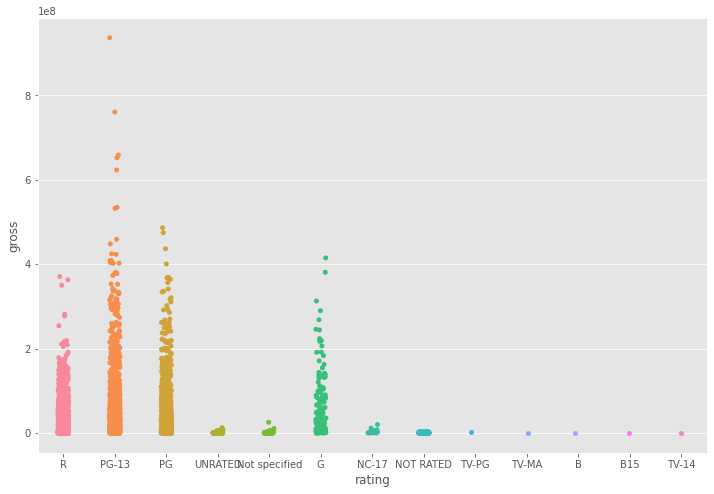

In [102]:
sns.stripplot(x="rating", y="gross", data=df)